In [1]:
import pandas as pd
import numpy as np
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

import random

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
df_oct = pd.read_csv("data/vumonic_india_food_delivery_20231001_20231031.csv", low_memory=False)
df_nov = pd.read_csv("data/vumonic_india_food_delivery_20231101_20231130.csv", low_memory=False)

# with open('data/vumonic_india_food_delivery_20231201_20231231.csv', 'r') as f:
#     first_line = f.readline()
# columns = first_line.replace('\n', '').split(',')
columns = df_nov.columns

df_dec = pd.read_csv('data/vumonic_india_food_delivery_20231201_20231231.csv', usecols=columns, encoding='latin-1', low_memory=False)

df = pd.concat([df_dec, df_nov, df_oct], ignore_index=True)
drop_columns = ['mid', 'sender_id', 'year', 'month', 'day', 'order_promotion_discount', 
                'order_coupon_discount', 'order_seller_discount', 'order_delivery_discount',
                'order_status', 'order_delivery_discount', 'delivery_address_postal_code', 'order_payment_currency',
                'restaurant_address_postal_code', 'user_dob', 'user_address_postal_code', 'user_address_country']
df =  df.drop(drop_columns, axis=1)
df = df[df['user_age'] != 'male']

In [3]:
df.head()

,transaction_id,company,email_timestamp,product_name,product_price,product_quantity,product_total,order_subtotal,order_convenience_fee,order_packaging_fee,order_delivery_fee,order_tip,order_taxes,order_membership_fee,order_discount,order_membership_discount,order_amount_paid,order_discount_code,premium_membership,premium_membership_type,free_delivery,order_payment_type,delivery_address_city,delivery_address_state,restaurant_name,restaurant_address_city,restaurant_address_state,user_id,user_gender,user_age,user_address_city,user_address_state,user_device_brand,user_device_model,user_os_type,user_onboard_at,user_inactive_at
0,bfa86dc42518cc98cb1f6a5dc3ac6a5d,swiggy,2023-12-01T00:08:24+00:00,Classic Chicken Roll,216.0,1.0,216.0,216.0,3.0,7.0,NaN,NaN,7.69,NaN,100.00,NaN,134.0,SWIGGYIT,True,swiggy_one,NaN,paytm,bangalore,karnataka,Rollsking,bangalore,karnataka,edb4a1a7320232810d47fdf695fdbeb1,male,23.0,Bengaluru,Karnataka,samsung,SM-G781B,android,2023-07-10T11:03:52.000Z,NaN
1,bfa86dc42518cc98cb1f6a5dc3ac6a5d,swiggy,2023-12-01T00:08:24+00:00,Multigrain Laccha Paratha Roll,NaN,NaN,NaN,216.0,3.0,7.0,NaN,NaN,7.69,NaN,100.00,NaN,134.0,SWIGGYIT,True,swiggy_one,Free,paytm,bangalore,karnataka,Rollsking,bangalore,karnataka,edb4a1a7320232810d47fdf695fdbeb1,male,23.0,Bengaluru,Karnataka,samsung,SM-G781B,android,2023-07-10T11:03:52.000Z,NaN
2,614f8a99775ff921f7360f4140a7ba11,swiggy,2023-12-01T00:10:41+00:00,Double Cheese Slice,NaN,NaN,NaN,256.0,3.0,10.0,NaN,NaN,8.84,NaN,99.99,NaN,178.0,FLATDEAL,True,swiggy_one,Free,bank,hyderabad,telangana,Shrimmers,hyderabad,telangana,a13bf807ac3741ae6d118472115fef00,male,28.0,Hyderabad,Telangana,realme,RMX3395,android,2023-05-02T22:38:13.000Z,NaN
3,614f8a99775ff921f7360f4140a7ba11,swiggy,2023-12-01T00:10:41+00:00,Crispy Potato Burger,89.0,1.0,89.0,256.0,3.0,10.0,NaN,NaN,8.84,NaN,99.99,NaN,178.0,FLATDEAL,True,swiggy_one,NaN,bank,hyderabad,telangana,Shrimmers,hyderabad,telangana,a13bf807ac3741ae6d118472115fef00,male,28.0,Hyderabad,Telangana,realme,RMX3395,android,2023-05-02T22:38:13.000Z,NaN
4,614f8a99775ff921f7360f4140a7ba11,swiggy,2023-12-01T00:10:41+00:00,Cheese Slice,NaN,NaN,NaN,256.0,3.0,10.0,NaN,NaN,8.84,NaN,99.99,NaN,178.0,FLATDEAL,True,swiggy_one,Free,bank,hyderabad,telangana,Shrimmers,hyderabad,telangana,a13bf807ac3741ae6d118472115fef00,male,28.0,Hyderabad,Telangana,realme,RMX3395,android,2023-05-02T22:38:13.000Z,NaN


In [4]:
dfp = df

In [5]:
dfp.delivery_address_city = dfp.delivery_address_city.astype('str').apply(lambda x: x.lower())

In [6]:
city = 'new delhi'

In [7]:
df_city = dfp[dfp.delivery_address_city == city.lower()]
df_city

,transaction_id,company,email_timestamp,product_name,product_price,product_quantity,product_total,order_subtotal,order_convenience_fee,order_packaging_fee,order_delivery_fee,order_tip,order_taxes,order_membership_fee,order_discount,order_membership_discount,order_amount_paid,order_discount_code,premium_membership,premium_membership_type,free_delivery,order_payment_type,delivery_address_city,delivery_address_state,restaurant_name,restaurant_address_city,restaurant_address_state,user_id,user_gender,user_age,user_address_city,user_address_state,user_device_brand,user_device_model,user_os_type,user_onboard_at,user_inactive_at
25,6ca7aa233b307e2dd5c229b66e944079,swiggy,2023-12-01T02:32:17+00:00,Upma,169.0,1.0,169.00,348.0,3.0,30.0,26.0,NaN,14.94,NaN,99.99,NaN,322.0,BFBINGE,NaN,NaN,NaN,creditdebit_card,new delhi,delhi,Bheemeshwara A South Indian Delicacy,new delhi,delhi,c0433e5a7b7b1d11f183e1dfd9ec4f09,female,22.0,Bengaluru,Karnataka,realme,RMX3521,android,2023-08-02T13:43:24.000Z,NaN
26,6ca7aa233b307e2dd5c229b66e944079,swiggy,2023-12-01T02:32:17+00:00,Idli (3 Pcs),179.0,1.0,179.00,348.0,3.0,30.0,26.0,NaN,14.94,NaN,99.99,NaN,322.0,BFBINGE,NaN,NaN,NaN,creditdebit_card,new delhi,delhi,Bheemeshwara A South Indian Delicacy,new delhi,delhi,c0433e5a7b7b1d11f183e1dfd9ec4f09,female,22.0,Bengaluru,Karnataka,realme,RMX3521,android,2023-08-02T13:43:24.000Z,NaN
40,d91eaa0f32af525a084ea957c7486ed3,swiggy,2023-12-01T03:06:07+00:00,Chole Bhature,50.0,1.0,50.00,50.0,3.0,NaN,47.0,NaN,3.04,NaN,28.00,NaN,75.0,SWIGGYLOVE-MDYKQJ,NaN,NaN,NaN,bank,new delhi,delhi,Sharma bhature wale,new delhi,delhi,010fa8a1da9dd120badc6a4094d58ca3,male,38.0,Ghaziabad,Uttar Pradesh,OPPO,CPH2201,android,2023-07-03T07:22:16.000Z,NaN
79,904e2eca3e2226760acabba1dec936fe,swiggy,2023-12-01T04:26:41+00:00,Idli Sambar(1 Piece),NaN,NaN,NaN,259.0,3.0,20.0,NaN,NaN,10.12,NaN,125.00,NaN,167.0,FLAT125,True,swiggy_one,Free,paytm,new delhi,delhi,Anna Ka Dosa,new delhi,delhi,373612e33a74d4524b2d1eee235fcebb,female,23.0,Delhi,National Capital Territory of Delhi,Apple,unknown,ios,2022-08-12T12:06:11.000Z,NaN
80,904e2eca3e2226760acabba1dec936fe,swiggy,2023-12-01T04:26:41+00:00,Anna Masala Dosa,259.0,1.0,259.00,259.0,3.0,20.0,NaN,NaN,10.12,NaN,125.00,NaN,167.0,FLAT125,True,swiggy_one,NaN,paytm,new delhi,delhi,Anna Ka Dosa,new delhi,delhi,373612e33a74d4524b2d1eee235fcebb,female,23.0,Delhi,National Capital Territory of Delhi,Apple,unknown,ios,2022-08-12T12:06:11.000Z,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
740999,cd7591e4576a926f45b3108d67e31eed,swiggy,2023-10-10T17:22:35+00:00,Create Your Flavour Fun Combo Box Of 2 Veg P...,208.0,1.0,208.00,208.0,3.0,39.0,NaN,NaN,12.35,NaN,NaN,NaN,262.0,NaN,True,swiggy_one,NaN,NaN,new delhi,delhi,Pizza Hut,new delhi,delhi,9a22c2b28c9eb4295e7280d4f8d285b4,male,29.0,Delhi,National Capital Territory of Delhi,asus,ASUS_X01AD,android,2020-04-15T22:28:51.000Z,NaN
741000,cd7591e4576a926f45b3108d67e31eed,swiggy,2023-10-10T17:22:35+00:00,Margherita Pizza,NaN,1.0,NaN,208.0,3.0,39.0,NaN,NaN,12.35,NaN,NaN,NaN,262.0,NaN,True,swiggy_one,Free,NaN,new delhi,delhi,Pizza Hut,new delhi,delhi,9a22c2b28c9eb4295e7280d4f8d285b4,male,29.0,Delhi,National Capital Territory of Delhi,asus,ASUS_X01AD,android,2020-04-15T22:28:51.000Z,NaN
741001,af4bf7a90a4926621e44874c3b8b9efa,swiggy,2023-10-10T17:05:32+00:00,Mini Tiffin B,219.04,1.0,219.04,219.0,3.0,NaN,NaN,NaN,10.95,NaN,NaN,NaN,233.0,NaN,True,swiggy_one,NaN,NaN,new delhi,delhi,Hotel Saravana Bhavan,new delhi,delhi,9a22c2b28c9eb4295e7280d4f8d285b4,male,29.0,Delhi,National Capital Territory of Delhi,asus,ASUS_X01AD,android,2020-04-15T22:28:51.000Z,NaN
741013,00412acc1a45e7c8d3420a140333051b,swiggy,2023-10-10T20:12:58+00:00,Kadhai Paneer,185.0,1.0,185.00,230.0,3.0,10.0,NaN,NaN,12.00,NaN,NaN,NaN,255.0,NaN,NaN,NaN,NaN,NaN,new delhi,delhi,Apni Rasoi,NaN,delhi,b67670c4aa396113171cae1cb8f87c4f,male,24.0,Delhi,National Capital Territ

In [8]:
df_itemcount = df_city[~df_city.product_name.str.lower().str.contains('no ', na=False)].product_name.value_counts().head(15).reset_index().rename(columns={'product_name': 'count', 'index': 'product_name'})

In [9]:
# Min-Max Normalization
# df_itemcount['count_minmax'] = (df_itemcount['count'] - 0) / (df_itemcount['count'].max() - 0)
df_itemcount['count_minmax'] = df_itemcount['count'] / df_itemcount['count'].sum()
df_itemcount

,product_name,count,count_minmax
0,Pizza McPuff,243,0.090977
1,Butter Naan,241,0.090228
2,Regular,238,0.089105
3,Rumali Roti,230,0.086110
4,Onions,185,0.069262
5,Cucumber,183,0.068514
6,Dal Makhani,181,0.067765
7,Margherita Pizza,165,0.061775
8,Capsicum,161,0.060277
9,Olives,150,0.056159


In [10]:
items = df_itemcount['product_name']

In [11]:
itemchoice = random.choices(items, weights=df_itemcount['count_minmax'], k=1)[0]

In [12]:
df_city_item = df_city[df_city.product_name == itemchoice]
res_choice = random.choice(df_city_item.restaurant_name.value_counts(dropna=False).head(5).index.tolist())

In [13]:
column_names = [
    'company', 'product_name', 'product_price', 
    'product_quantity', 'product_total', 'order_convenience_fee', 
    'order_packaging_fee', 'order_delivery_fee', 'order_taxes', 'order_discount',
    'order_discount_code', 'premium_membership', 
    'premium_membership_type', 'free_delivery',
    'delivery_address_city', 'delivery_address_state', 'restaurant_name', 
    'restaurant_address_city', 'restaurant_address_state'
]

df_print = df_city_item[df_city_item.restaurant_name == res_choice].sample(n=1)[column_names].reset_index(drop=True)

In [14]:
image_generation_string = f"Food item {itemchoice} from restaurant {res_choice}"

In [15]:
import requests

API_URL = "https://api-inference.huggingface.co/models/runwayml/stable-diffusion-v1-5"
headers = {"Authorization": "Bearer hf_api_token"}

def query(payload):
	response = requests.post(API_URL, headers=headers, json=payload)
	return response.content
image_bytes = query({
	"inputs": image_generation_string,
})
# You can access the image with PIL.Image for example
import io
from PIL import Image
image = Image.open(io.BytesIO(image_bytes))

Food item Pizza McPuff from restaurant McDonalds


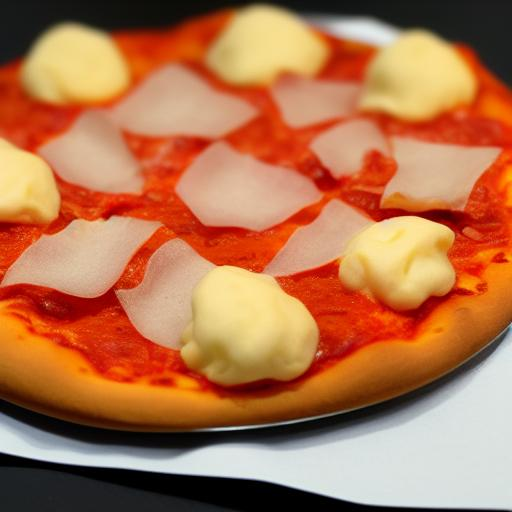

In [16]:
print(image_generation_string)
image

In [17]:
df_print

,company,product_name,product_price,product_quantity,product_total,order_convenience_fee,order_packaging_fee,order_delivery_fee,order_taxes,order_discount,order_discount_code,premium_membership,premium_membership_type,free_delivery,delivery_address_city,delivery_address_state,restaurant_name,restaurant_address_city,restaurant_address_state
0,swiggy,Pizza McPuff,NaN,NaN,NaN,3.0,37.0,NaN,12.14,78.0,SWIGGYIT,True,swiggy_one,Free,new delhi,delhi,McDonalds,new delhi,delhi


In [18]:
for i in df_print:
    print(i.title(), ':', str(df_print[i][0]))

Company : swiggy
Product_Name : Pizza McPuff
Product_Price : nan
Product_Quantity : nan
Product_Total : nan
Order_Convenience_Fee : 3.0
Order_Packaging_Fee : 37.0
Order_Delivery_Fee : nan
Order_Taxes : 12.14
Order_Discount : 78.0
Order_Discount_Code : SWIGGYIT
Premium_Membership : True
Premium_Membership_Type : swiggy_one
Free_Delivery : Free
Delivery_Address_City : new delhi
Delivery_Address_State : delhi
Restaurant_Name : McDonalds
Restaurant_Address_City : new delhi
Restaurant_Address_State : delhi


In [19]:
prompt = f"Create a delicious product description of Food item {itemchoice} from restaurant {res_choice} in around 100 words..\n(Write your food item review with good keywords)"

In [20]:
import requests

# API_URL = "https://api-inference.huggingface.co/models/mistralai/Mistral-7B-v0.1"
# API_URL = "https://api-inference.huggingface.co/models/meta-llama/Llama-2-7b-chat-hf"
API_URL = "https://api-inference.huggingface.co/models/google/gemma-7b-it"
headers = {"Authorization": "Bearer hf_api_token"}

def query(payload):
	response = requests.post(API_URL, headers=headers, json=payload)
	return response.json()
	
output = query({
	"inputs": prompt,
})

In [21]:
output[0]['generated_text'].replace(prompt, '').replace('\n', ' ')

"  Calling all pizza lovers! Treat yourself to the classic flavor of the Pizza McPuff, a crispy and golden pocket filled with melted cheese, tangy tomato sauce, and fresh vegetables. Each bite delivers a symphony of flavors and textures, perfect for satisfying your hunger. The Pizza McPuff is crafted using fresh, quality ingredients and is available for a limited time only. Don't miss out on this foodie masterpiece!  **Keywords:** Pizza McPuff, Classic Flavor, Crispy & Golden, Melted"

In [22]:
output

[{'generated_text': "Create a delicious product description of Food item Pizza McPuff from restaurant McDonalds in around 100 words..\n(Write your food item review with good keywords)\n\nCalling all pizza lovers! Treat yourself to the classic flavor of the Pizza McPuff, a crispy and golden pocket filled with melted cheese, tangy tomato sauce, and fresh vegetables. Each bite delivers a symphony of flavors and textures, perfect for satisfying your hunger. The Pizza McPuff is crafted using fresh, quality ingredients and is available for a limited time only. Don't miss out on this foodie masterpiece!\n\n**Keywords:** Pizza McPuff, Classic Flavor, Crispy & Golden, Melted"}]

In [37]:
import requests
model_id = "sentence-transformers/all-MiniLM-L6-v2"
api_url = f"https://api-inference.huggingface.co/pipeline/feature-extraction/{model_id}"
headers = {"Authorization": "Bearer hf_api_token"}

ty = df.delivery_address_city.unique().tolist()
ty.remove('nan')

def query(texts):
    response = requests.post(api_url, headers=headers, json={"inputs": texts, "options":{"wait_for_model":True}})
    return response.json()

output = query(ty)
output

[[0.005464623682200909,
  -0.019250500947237015,
  -0.04663952812552452,
  0.04402830824255943,
  -0.06767857074737549,
  0.04783901199698448,
  -0.007420348934829235,
  -0.01728276163339615,
  -0.05532257631421089,
  -0.03355651721358299,
  -0.029035348445177078,
  -0.1335759162902832,
  0.09679651260375977,
  -0.04994291439652443,
  0.04336308315396309,
  0.052794162184000015,
  0.05546584725379944,
  -0.1190447211265564,
  0.04685094952583313,
  -0.07015573233366013,
  -0.04159006103873253,
  0.08399395644664764,
  -0.03540034219622612,
  -0.06150750070810318,
  0.06450881063938141,
  -0.026996878907084465,
  -0.0002245386567665264,
  -0.07459358125925064,
  0.029850469902157784,
  -0.07750973105430603,
  0.08265886455774307,
  0.07185015827417374,
  0.016056764870882034,
  0.005868279840797186,
  0.039180271327495575,
  -0.037603944540023804,
  -0.011329906061291695,
  0.005494127981364727,
  0.07253887504339218,
  -0.03367064893245697,
  -0.030860552564263344,
  0.0636890903115272

In [60]:
ty = df.delivery_address_city.unique().tolist()
ty.remove('nan')

def query(texts):
    response = requests.post(api_url, headers=headers, json={"inputs": texts, "options":{"wait_for_model":True}})
    return response.json()

output = query(ty)
eb = pd.DataFrame(data={"City":ty, "Embedding":output})
question = ["Delhi"]
query_output = query(question)

hits = semantic_search(torch.FloatTensor(query_output), torch.FloatTensor(eb['Embedding'].tolist()), top_k=5)
city_options = [eb["City"][hits[0][i]['corpus_id']] for i in range(len(hits[0]))]
city_options

['delhi', 'new delhi', 'bharatpur', 'rajgarh', 'hindupur']

In [57]:
question = ["Delhi"]
query_output = query(question)

# query_embeddings = torch.FloatTensor(output)
query_output

[[-0.02182658575475216,
  0.027328193187713623,
  -0.03021470084786415,
  0.04086669161915779,
  -0.06457824259996414,
  -0.059152282774448395,
  0.02594808116555214,
  0.03250688686966896,
  0.006937847007066011,
  -0.03484044596552849,
  0.035815201699733734,
  -0.15703634917736053,
  0.03936318680644035,
  -0.04182220622897148,
  0.016647307202219963,
  -0.045618996024131775,
  0.06294628977775574,
  0.03551904857158661,
  0.03305083140730858,
  -0.1240316703915596,
  -0.015190335921943188,
  0.039551928639411926,
  0.03304808959364891,
  -0.027211591601371765,
  -0.02118407003581524,
  0.010310196317732334,
  0.02608480304479599,
  -0.016490379348397255,
  0.049245480448007584,
  -0.05167703330516815,
  0.06353244185447693,
  0.08011510968208313,
  -0.03977026790380478,
  0.018918925896286964,
  0.0199159923940897,
  0.025241520255804062,
  -0.11263896524906158,
  0.001141122542321682,
  0.13408556580543518,
  -0.09089219570159912,
  0.0745786502957344,
  -0.01011456549167633,
  0.

In [58]:
from sentence_transformers.util import semantic_search
import torch

hits = semantic_search(torch.FloatTensor(query_output), torch.FloatTensor(eb['Embedding'].tolist()), top_k=5)
hits

[[{'corpus_id': 68, 'score': 1.0000001192092896},
  {'corpus_id': 8, 'score': 0.8693604469299316},
  {'corpus_id': 453, 'score': 0.7149709463119507},
  {'corpus_id': 980, 'score': 0.686246395111084},
  {'corpus_id': 830, 'score': 0.6818331480026245}]]

In [59]:
print([eb["City"][hits[0][i]['corpus_id']] for i in range(len(hits[0]))])

['delhi', 'new delhi', 'bharatpur', 'rajgarh', 'hindupur']
